# Credit Card Churn

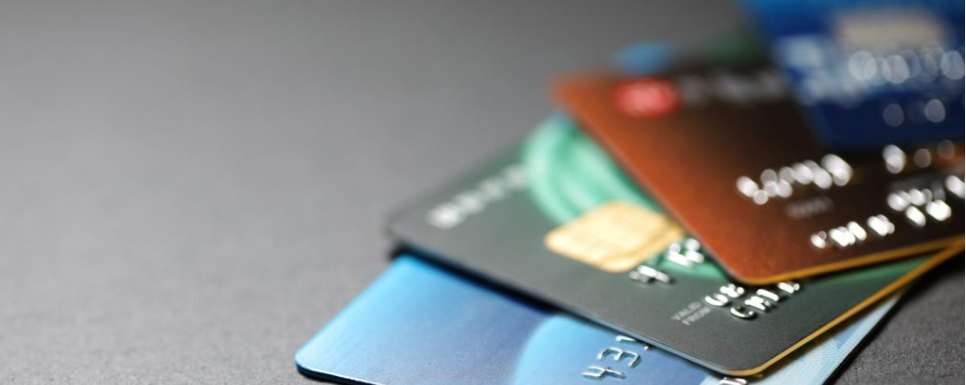

In [1]:
from IPython.display import Image
Image("card.png")

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true;
function code_toggle() {
if (code_show){
$('div.input').hide();
} else {
$('div.input').show();
}
code_show = !code_show
}
$( document ).ready(code_toggle);
</script>
For a more presentable and an easy reading experience, the raw code for this iPython notebook is hidden.
If you want to see the raw code, please click <a href="javascript:code_toggle()">here</a>.''')

## Rationale

There are a few reasons on the purpose of my analysis focus.
1. Firstly, with Australia' laws and regulations continue to be tightened around credit cards/unsecured lending products, this literally has set a strong barrier and made acquisition to be a challenging business.

2. Many FIs have had explored and shifted their strategies towards a more sustainable yet realistic profit model. This means offering top notch services to existing customers / thinking ahead what customers' needs/wants are more protruding - 'we are in this together'.

3. Lastly the cost of retaining a customer is always cheaper than acquiring a new one, so it makes sense to look at ways we can review the existing portfolio and probably having some predictive power to know in advance before any credit card customer likely to cancel his/her credit card ('the unbeknownst').

<b>As such, this following case study reviewed a pool of credit card customers and if they have their credit card churn. Next, identifying any influential factors that can lead customers to leave the business.</b>

## Where the data is sourced?

Source: https://www.kaggle.com/sakshigoyal7/credit-card-customers


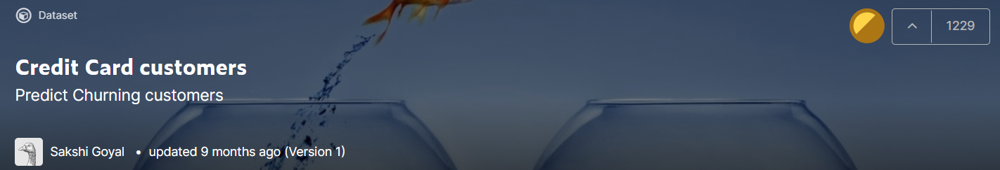

In [3]:
from IPython.display import Image
print('Source: {}'.format('https://www.kaggle.com/sakshigoyal7/credit-card-customers'))
Image("Source.png")

## Case Study | Background

A manager at a local bank is disturbed with more and more customers leaving their credit card services. They need a way of predicting which customers are most likely to stop using their credit card products (Customer Churn) in order to proactively check in on the customer to provide them better services in order to convince them to change their minds. You are given a dataset of 10,000 customers with 18 features per customer. Roughly 16% of the current customer base have churned so far, so it will be difficult to predict the ones who will.

As you analyze the data, before you create the model, the sales team also needs you to determine the most influential factors that can lead to a customer's decision of leaving the business. The head of the sales department is expecting a report that helps them visualize where the differences lie between churning and non-churning customers.

<b>Objectives:</b>

- Identify which customers are most likely to be churned so the bank manager knows who to provide a better service to

  - The Top Priority is to identify churning customers,as if we predict non-churning customers as churned, it won't harm our business, but predicting churning customers as Non-churning will. False negatives won't hurt us, but False Positives do
  - This task is binary classification

- A clean and easy to understand visual report that helps the sales team better visualize what makes a client churn or not churn.

## What tells if the predictive model is good?

<b>Model performance is usually assessed by Accuracy Score, Recall and Precision via confusion matrix.</b>

<u>Potential Issues:</u>
    
- Any duplication / missing values
- Outliers/abnormality
- Highly correlated features
- Data distribution. Note. Since only 16% of the customers are churned, a data upsampling method (like SMOTE) is needed to match them with the regular customer size to give our model a better chance of catching small details that would be missed had we not upsampled it.

## ML Scikits Learn | DM Tools

Before we get started, let's bring in all the required data management tools and model libraries. 
- Standard boiler plates and data cleansing tools
- Scikit learn machine learning models e.g. Regression, Classification, Clustering, PyTorch, Keras etc

### Standard Boilerplates

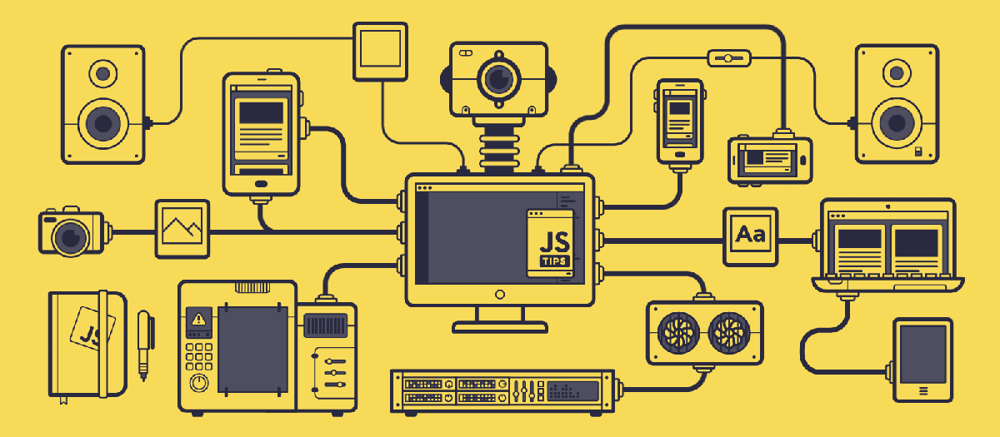

In [4]:
from IPython.display import Image
Image("machinelearning.gif")

In [5]:
# Import basic libraries
import matplotlib.pyplot as plt
import numpy as np # for linear algebra eg np.log, np.where, np.mean, np.std
import pandas as pd # for import data eg pd.read_csv, pd.DataFrame or pd.Series, pd.get_dummies(col_name,drop_first=True)
import seaborn as sns # mainly for visualisation
import sweetviz as sv
import plotly.express as px #plotly visualisation (aka ggplot2 in R)
from tabulate import tabulate #construct table
import time # if dealing with date and time or time series data
sns.set() # Optional:: this just make the plot nicer by changing the color, fontsize etc
import datetime as dt
#This syntax helps to display inline within frontends like the Jupyter notebook, 
#directly below the code cell that produced it. 
#The resulting plots will published nicedly within the notebook document.
get_ipython().run_line_magic('matplotlib', 'inline')
#display all float to 3dp
pd.set_option('display.float','{:.2f}'.format)
pd.set_option('display.max_columns',50)
pd.set_option('display.max_rows',100)

#Warning messages are typically issued in situations where it is useful to alert the user of some condition in a program, 
#where that condition (normally) doesn’t warrant raising an exception and terminating the program. 
#For example, one might want to issue a warning when a program uses an obsolete module.
from warnings import filterwarnings
filterwarnings('ignore')

# Imports from some common scikit-learns packages

#for Data & Decision Tree Visualisation
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import tree
import plotly.express as plx
from pandas.plotting import scatter_matrix
from collections import Counter
from imblearn.over_sampling import SMOTE
#scikit models
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesRegressor, ExtraTreesClassifier 
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.ensemble import AdaBoostRegressor, AdaBoostClassifier
from xgboost.sklearn import XGBClassifier
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostRegressor, Pool, cv
from sklearn.svm import SVR 
from sklearn.cluster import KMeans
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, learning_curve
from sklearn.model_selection import KFold # import KFold
from sklearn.feature_selection import RFECV  ##Recursive Feature Elimination with Cross Validation
from sklearn.feature_selection import RFE  ##Recursive Feature Elimination
import sklearn.metrics as metrics
from sklearn.metrics import mean_squared_error as MSE, r2_score, confusion_matrix
from sklearn.metrics import classification_report, recall_score, precision_score, accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

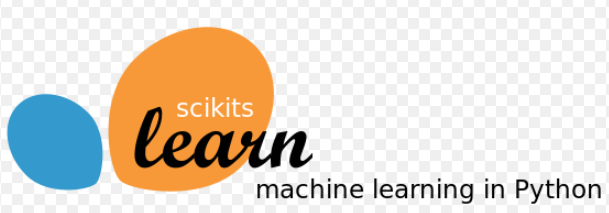

In [6]:
from IPython.display import Image
Image("sklearn.png")

In [7]:
# User-defined library
import Utils as util

### Data Ingestion

In [8]:
#Import files/data
data_path = './BankChurners.csv'
df = pd.read_csv(data_path, index_col=0)
print('Data is loaded successfully!')

Data is loaded successfully!


In [9]:
print('There are {} observations and {} features in the dataset:'.format(*df.shape))
print('\t Of which, {} numeric features'.format(df.select_dtypes(exclude='object').shape[1]))
print('\t And, {} non-numeric/object features.\n'.format(df.select_dtypes(include='object').shape[1]))
print('{}'.format(df.info()))

There are 10127 observations and 20 features in the dataset:
	 Of which, 14 numeric features
	 And, 6 non-numeric/object features.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10127 entries, 768805383 to 714337233
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     1

## Exploratory Data Analysis (EDA)

In [10]:
print("Unique values in each non-numeric column:\t")
for col in df.select_dtypes(include=[object]):
    print(col,"\n:", df[col].unique())

Unique values in each non-numeric column:	
Attrition_Flag 
: ['Existing Customer' 'Attrited Customer']
Gender 
: ['M' 'F']
Education_Level 
: ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status 
: ['Married' 'Single' 'Unknown' 'Divorced']
Income_Category 
: ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Card_Category 
: ['Blue' 'Gold' 'Silver' 'Platinum']


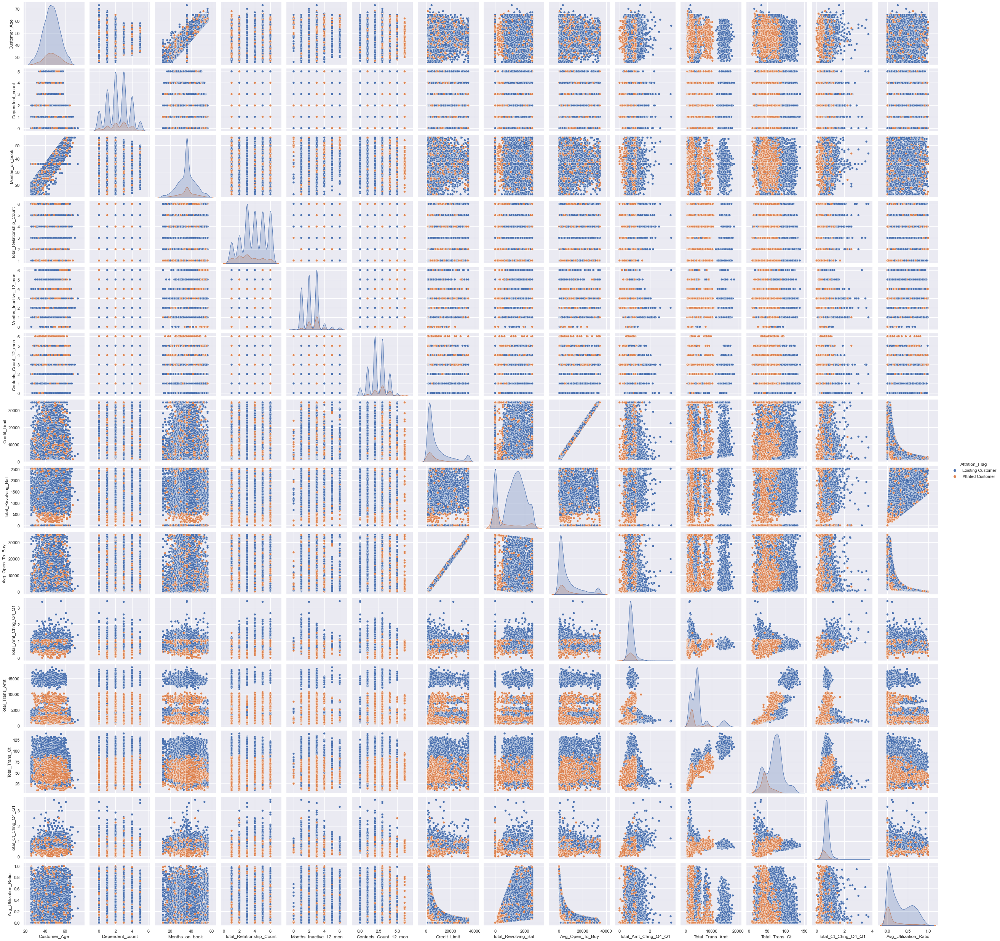

In [11]:
# View pairplot 
sns.pairplot(df, hue = 'Attrition_Flag')

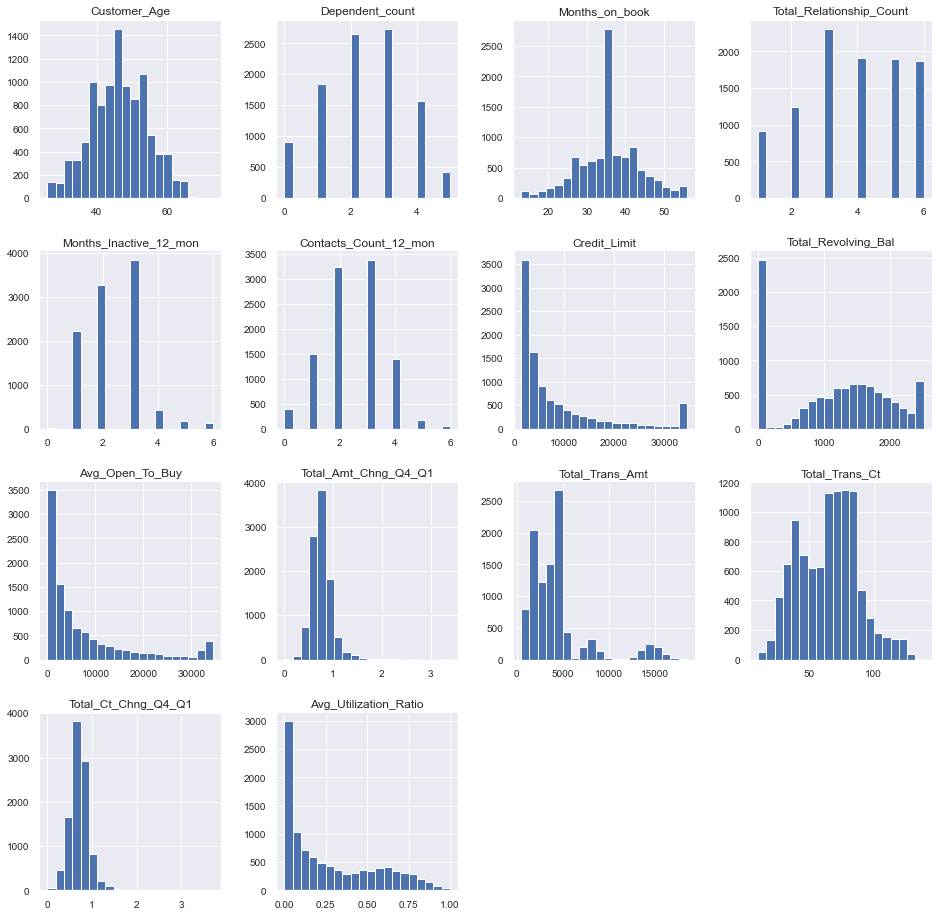

In [12]:
# View histograms
df.hist(figsize=(16,16), bins=20, ylabelsize='10', xlabelsize='10')
sns.despine(left=False, bottom=False)

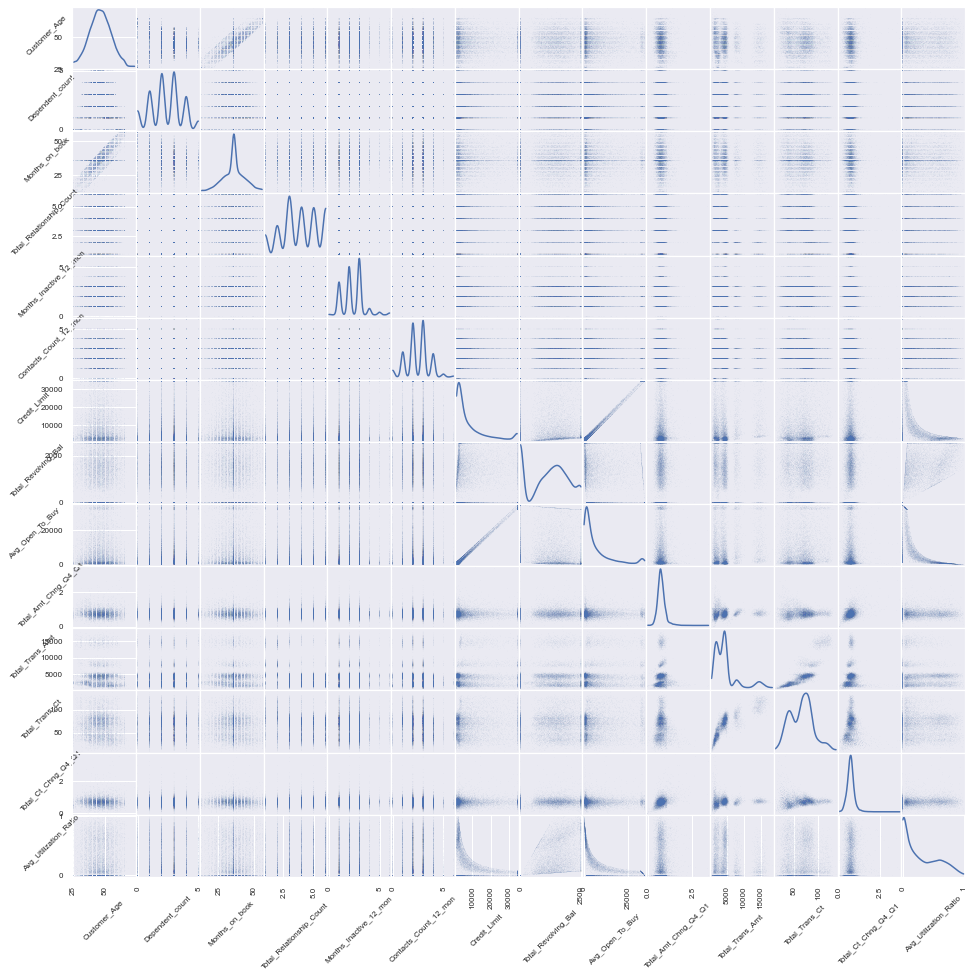

In [13]:
# View scatter plot matrix
from pandas.plotting import scatter_matrix
scatter_matrix = scatter_matrix(df, alpha=0.6, figsize=(16, 16), marker= ".", s = 0.2, diagonal = "kde")
for ax in scatter_matrix.ravel():
    ax.set_xlabel(ax.get_xlabel(), fontsize = 8, rotation = 45)
    ax.set_ylabel(ax.get_ylabel(), fontsize = 8, rotation = 45)
plt.show()

In [14]:
my_report = sv.compare_intra(df, df["Attrition_Flag"] == "Attrited Customer", ["Attrited Customer","Existing Customer"])

In [15]:
my_report.show_html('my_report.html')

Report my_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [16]:
# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
cat_features = df.select_dtypes(['object','category']).columns.to_list()
for cat in cat_features:
    fig = plx.pie(df[cat].value_counts(False), values=cat, names = df[cat].value_counts(False).index,title = cat,template='ggplot2')
    fig.show()

The customer gender is almost even, 30% college graduates with half being either Highschool graduates, unkown, or uneducated. The remaining 40% are either current college students,or grad students.

Almost half are married, 38% single, and the remaining 12 are divorced or unkown. 35% of customers make less than $40k per year which is near the poverty threshold. The rest are more evenly spaced out. 93% of customers choose the cheapest card option (likely the lowest interest rate) with a tiny portion choosing the more expensive cards

In [17]:
fig = plx.box(df, color="Attrition_Flag", y="Total_Relationship_Count",title='Number of products held by customer', points="all")
fig.show()

Churned customers are likely to hold less credit cards than existing customers which is shown by a lower median . Is there a deal you provide that favors customers with multiple credit cards? (Like customers with spouses, families, or buisnesses that need additional cards).

In [18]:
fig = plx.box(df, color="Attrition_Flag", y="Months_Inactive_12_mon", points="all",title='Number of months with no transactions in the last year')
fig.show()

Churned customers tend to have slightly more inactive months, but the distribution is more concentrated from the 1-4 months inactive (though this may be from the small sample size)

In [19]:
fig = plx.histogram(df, x="Credit_Limit", color="Attrition_Flag",title='Credit limit on the credit card')
fig.show()

Churned customers have a lower credit limit, so perhaps increase the credit limit for these

In [20]:
fig = plx.box(df, color="Attrition_Flag", y="Total_Revolving_Bal", points="all",title='Total revolving balance on the credit card')
fig.show()

Churned customers have a much smaller revolving balance which, because they don't fully pay off their credit card balance, may signify that they have less disposable income than staying customers that know they can pay off their revolving balance

In [21]:
fig = plx.histogram(df, x="Total_Trans_Ct", color="Attrition_Flag",title='Number of transactions made in the last year')
fig.show()

Churned customers will have a lower amount of transactions, which makes sense as they're less involved with this company and will have a smaller transaction change over time as displayed bellow

In [22]:
fig = fig = plx.box(df, color="Attrition_Flag", y="Total_Ct_Chng_Q4_Q1", points="all",title='Change in transaction number over the last year (Q4 over Q1)')
fig.show()

## Data Diagnostics & Review

### Handling Missing / Unknown Data

In [23]:
total_obs = df.isnull().count()
calculate_missing = df.isnull().sum()
total_missing = calculate_missing[calculate_missing.values>0].sort_values(ascending=False)
perc_missing = round(total_missing/total_obs*100,2)
perc_missing = perc_missing[perc_missing.values>0].sort_values(ascending=False)
col_missing_data = pd.concat([total_missing,perc_missing],axis=1,keys=['#','%']).sort_values('#',ascending=False)

summary_table = tabulate(col_missing_data, headers=["Features", "No of Obs Missing #", "No of Obs Missing %"])
print('There are {} columns with missing data.'.format(col_missing_data.shape[0]))
print('These columns are as follows:\n')
print(summary_table)

There are 0 columns with missing data.
These columns are as follows:

Features    No of Obs Missing #    No of Obs Missing %
----------  ---------------------  ---------------------


In [24]:
print("Unique values in each non-numeric column:\t")
for col in df.select_dtypes(include=[object]):
    print(col,"\n:", df[col].unique())

Unique values in each non-numeric column:	
Attrition_Flag 
: ['Existing Customer' 'Attrited Customer']
Gender 
: ['M' 'F']
Education_Level 
: ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status 
: ['Married' 'Single' 'Unknown' 'Divorced']
Income_Category 
: ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Card_Category 
: ['Blue' 'Gold' 'Silver' 'Platinum']


Most cases are tagged as Unknown. Let's see how many of these are tagged as unknown.

In [25]:
total_obs = df.select_dtypes(object).count()
total_unknowns = df.select_dtypes(object).apply(lambda x: x.str.contains('Unknown',na=False)).sum()
perc_unknown = round(total_unknowns/total_obs*100,2)
perc_unknown = perc_unknown[perc_unknown.values>0].sort_values(ascending=False)
col_unknown_data = pd.concat([total_unknowns,perc_unknown],axis=1,keys=['#','%']).sort_values('#',ascending=False)
summary_unknown = tabulate(col_unknown_data, headers=["Features", "No of Obs Unknowns #", "No of Obs Unknowns %"])
print('There are {} columns with Unknowns data.'.format(col_unknown_data.shape[0]))
print('These columns are as follows:\n')
print(summary_unknown)

There are 6 columns with Unknowns data.
These columns are as follows:

Features           No of Obs Unknowns #    No of Obs Unknowns %
---------------  ----------------------  ----------------------
Education_Level                    1519                   15
Income_Category                    1112                   10.98
Marital_Status                      749                    7.4
Attrition_Flag                        0                  nan
Gender                                0                  nan
Card_Category                         0                  nan


The number of unknown cases are relatively big and cannot be ignored. Next step, data imputation.

### Multi-Collinearity Check

<AxesSubplot:>

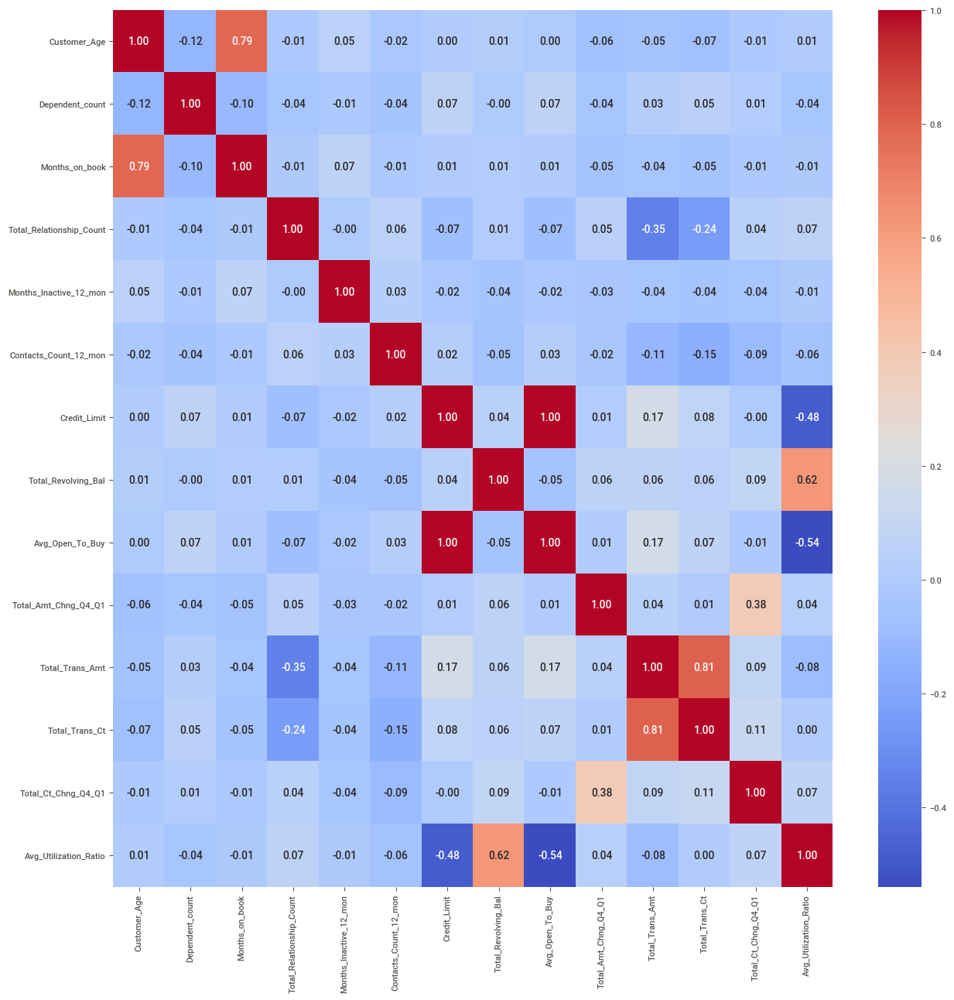

In [26]:
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f', ax=ax)

In [27]:
corr_matrix =(df.drop('Attrition_Flag', axis=1).select_dtypes(exclude='object')).corr()
upper_section = corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(np.bool))
# Find index of feature columns with correlation greater/less than +/- 0.60
upper = [column for column in upper_section.columns if any(upper_section[column] > 0.60)]
lower = [column for column in upper_section.columns if any(upper_section[column] < -0.60)]
hi_corr = upper + lower
hi_corr

['Months_on_book',
 'Avg_Open_To_Buy',
 'Total_Trans_Ct',
 'Avg_Utilization_Ratio']

Let's look at each of these features separately.

### Apply Dimension Reduction Technique

#### PCA (without Standardization)

In [28]:
#Let's look at the correlation again
feature_names = ['Months_on_book','Customer_Age','Credit_Limit','Avg_Open_To_Buy','Total_Trans_Ct','Total_Trans_Amt','Avg_Utilization_Ratio','Total_Revolving_Bal']
df[feature_names].corr()

,Months_on_book,Customer_Age,Credit_Limit,Avg_Open_To_Buy,Total_Trans_Ct,Total_Trans_Amt,Avg_Utilization_Ratio,Total_Revolving_Bal
Months_on_book,1.00,0.79,0.01,0.01,-0.05,-0.04,-0.01,0.01
Customer_Age,0.79,1.00,0.00,0.00,-0.07,-0.05,0.01,0.01
Credit_Limit,0.01,0.00,1.00,1.00,0.08,0.17,-0.48,0.04
Avg_Open_To_Buy,0.01,0.00,1.00,1.00,0.07,0.17,-0.54,-0.05
Total_Trans_Ct,-0.05,-0.07,0.08,0.07,1.00,0.81,0.00,0.06
Total_Trans_Amt,-0.04,-0.05,0.17,0.17,0.81,1.00,-0.08,0.06
Avg_Utilization_Ratio,-0.01,0.01,-0.48,-0.54,0.00,-0.08,1.00,0.62
Total_Revolving_Bal,0.01,0.01,0.04,-0.05,0.06,0.06,0.62,1.00


In [29]:
X_PCA = pd.DataFrame(df, columns=feature_names)
y_PCA = pd.Series(df['Attrition_Flag'], name='label')

<IPython.core.display.Javascript object>

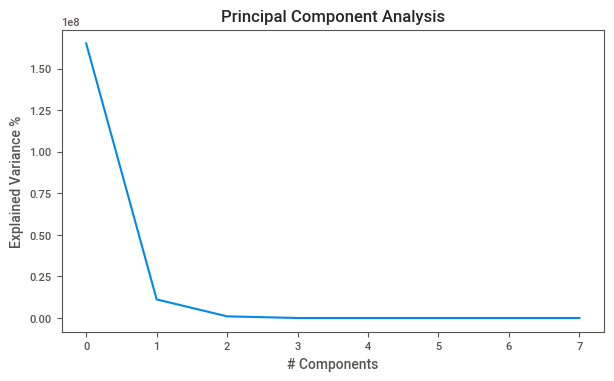

In [30]:
pca = PCA(n_components=8).fit(X_PCA)
plt.figure(figsize=(7,4))
plt.plot(pca.explained_variance_)
plt.title('Principal Component Analysis')
plt.xlabel('# Components')
plt.ylabel('Explained Variance %')
plt.show()

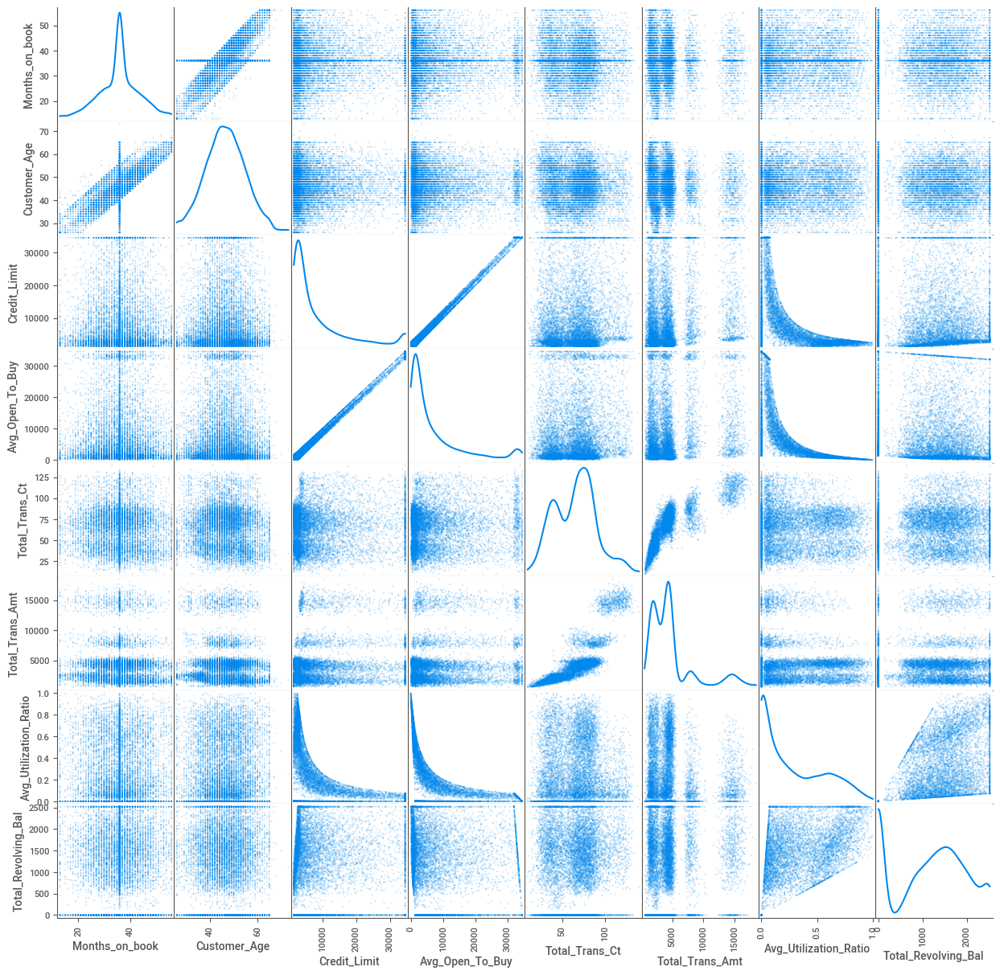

In [31]:
feature = pd.DataFrame(df[feature_names])
from pandas.plotting import scatter_matrix
scatter_matrix(feature,alpha=0.2,figsize=(15,15),diagonal='kde')
sns.despine()

In [32]:
#instantiate model and fit_transform the X features
pca_model = PCA(n_components=2)
data_pca = pca_model.fit_transform(feature)

<IPython.core.display.Javascript object>

In [33]:
print('Original Covariance{Features}:')
print(np.cov(np.array(feature).T))
print('\nCovariance After PCA(Components):')
print((np.cov(data_pca.T)))

Original Covariance{Features}:
[[ 6.37828458e+01  5.05105986e+01  5.44909434e+02  4.88785082e+02
  -9.33917109e+00 -1.04699807e+03 -1.66033157e-02  5.61243526e+01]
 [ 5.05105986e+01  6.42693072e+01  1.80425434e+02  8.38594864e+01
  -1.26259679e+01 -1.26493086e+03  1.57236209e-02  9.65659474e+01]
 [ 5.44909434e+02  1.80425434e+02  8.26058610e+07  8.22911081e+07
   1.61980158e+04  5.30229703e+06 -1.21016470e+03  3.14752850e+05]
 [ 4.88785082e+02  8.38594864e+01  8.22911081e+07  8.26405597e+07
   1.51255872e+04  5.12407981e+06 -1.35037312e+03 -3.49451507e+05]
 [-9.33917109e+00 -1.26259679e+01  1.61980158e+04  1.51255872e+04
   5.50961563e+02  6.43649728e+04  1.83659562e-02  1.07242869e+03]
 [-1.04699807e+03 -1.26493086e+03  5.30229703e+06  5.12407981e+06
   6.43649728e+04  1.15404872e+07 -7.77665164e+01  1.78217218e+05]
 [-1.66033157e-02  1.57236209e-02 -1.21016470e+03 -1.35037312e+03
   1.83659562e-02 -7.77665164e+01  7.60057862e-02  1.40208416e+02]
 [ 5.61243526e+01  9.65659474e+01  3.1

In [34]:
display(pd.DataFrame(abs(pca_model.components_),\
                index=['First_PCA','Second_PCA'], \
                columns=[feature_names]))

,Months_on_book,Customer_Age,Credit_Limit,Avg_Open_To_Buy,Total_Trans_Ct,Total_Trans_Amt,Avg_Utilization_Ratio,Total_Revolving_Bal
First_PCA,0.00,0.00,0.71,0.71,0.00,0.05,0.00,0.00
Second_PCA,0.00,0.00,0.03,0.04,0.01,1.00,0.00,0.02


#### PCA (with Standardization)

In [35]:
feature_scaled = feature/feature.std()
print('Variance of feature:\n{}'.format(feature.var(axis=0)))
print('Variance of feature_scaled:\n{}'.format(feature_scaled.var(axis=0)))

Variance of feature:
Months_on_book                63.78
Customer_Age                  64.27
Credit_Limit            82605861.00
Avg_Open_To_Buy         82640559.65
Total_Trans_Ct               550.96
Total_Trans_Amt         11540487.17
Avg_Utilization_Ratio          0.08
Total_Revolving_Bal       664204.36
dtype: float64
Variance of feature_scaled:
Months_on_book          1.00
Customer_Age            1.00
Credit_Limit            1.00
Avg_Open_To_Buy         1.00
Total_Trans_Ct          1.00
Total_Trans_Amt         1.00
Avg_Utilization_Ratio   1.00
Total_Revolving_Bal     1.00
dtype: float64


In [36]:
pca_scaled =PCA(n_components=2).fit_transform(feature_scaled)
components_scaled = PCA(n_components=2).fit(feature_scaled).components_
print('Dimension of projected feature: {}'.format(pca_scaled.shape[1]))
print('\nPCA Components:\n1st {}\n2nd {}'.format(components_scaled[0],components_scaled[1]))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dimension of projected feature: 2

PCA Components:
1st [-0.0202188  -0.02851057  0.56281964  0.57889265  0.17879586  0.24221814
 -0.47290676 -0.18060265]
2nd [-0.49460461 -0.4987569  -0.07521372 -0.09165784  0.47384908  0.44639882
  0.1871781   0.18360029]


In [37]:
display(pd.DataFrame(abs(components_scaled),\
                index=['First_PCA','Second_PCA'], \
                columns=[feature_names]))

,Months_on_book,Customer_Age,Credit_Limit,Avg_Open_To_Buy,Total_Trans_Ct,Total_Trans_Amt,Avg_Utilization_Ratio,Total_Revolving_Bal
First_PCA,0.02,0.03,0.56,0.58,0.18,0.24,0.47,0.18
Second_PCA,0.49,0.50,0.08,0.09,0.47,0.45,0.19,0.18


In [38]:
print('Lets compare before and apply scaled impact on these features:\n')
print('Before Scaled:')
display(pd.DataFrame(abs(pca_model.components_),\
                     index=['First_PCA','Second_PCA'], \
                     columns=[feature_names]))
print('After Scaled:')
display(pd.DataFrame(components_scaled,\
                     index=['First_PCA','Second_PCA'],\
                     columns=[feature_names]))

Lets compare before and apply scaled impact on these features:

Before Scaled:


,Months_on_book,Customer_Age,Credit_Limit,Avg_Open_To_Buy,Total_Trans_Ct,Total_Trans_Amt,Avg_Utilization_Ratio,Total_Revolving_Bal
First_PCA,0.00,0.00,0.71,0.71,0.00,0.05,0.00,0.00
Second_PCA,0.00,0.00,0.03,0.04,0.01,1.00,0.00,0.02


After Scaled:


,Months_on_book,Customer_Age,Credit_Limit,Avg_Open_To_Buy,Total_Trans_Ct,Total_Trans_Amt,Avg_Utilization_Ratio,Total_Revolving_Bal
First_PCA,-0.02,-0.03,0.56,0.58,0.18,0.24,-0.47,-0.18
Second_PCA,-0.49,-0.50,-0.08,-0.09,0.47,0.45,0.19,0.18


In [39]:
response_rows = df['Attrition_Flag'] == 'Attrited Customer'
not_response_rows = df['Attrition_Flag'] == 'Existing Customer'

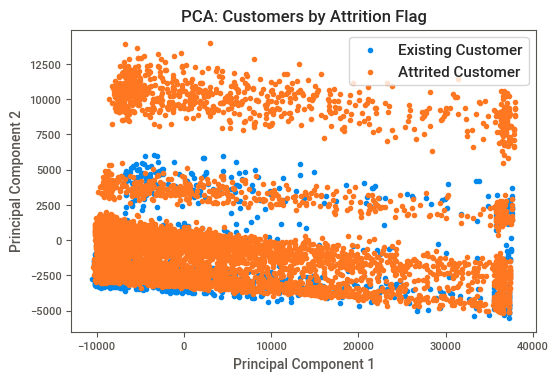

In [40]:
plt.scatter(data_pca[response_rows,0],data_pca[response_rows,1])
plt.scatter(data_pca[not_response_rows,0],data_pca[not_response_rows,1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Customers by Attrition Flag')
plt.legend(['Existing Customer','Attrited Customer'])
plt.show()

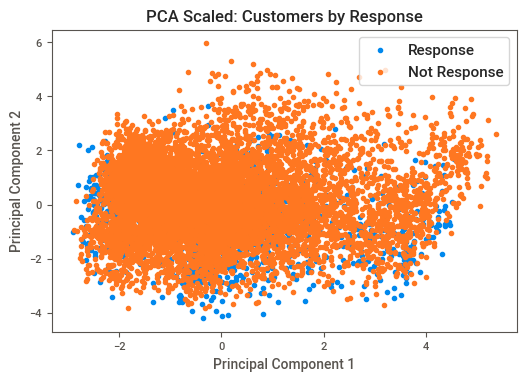

In [41]:
plt.scatter(pca_scaled[response_rows,0],pca_scaled[response_rows,1])
plt.scatter(pca_scaled[not_response_rows,0],pca_scaled[not_response_rows,1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Scaled: Customers by Response')
plt.legend(['Response','Not Response'])
plt.show()

With the PCA comparison above, it is more conclusive to use non standardized features when applying PCA. Now let's combine them  and drop what is not needed.

In [42]:
principalDf = pd.DataFrame(data=data_pca,columns=['PCA_1_CredL_AvgOpen_Buy','PCA_2_Tran_Amt'])
principalDf.tail()

,PCA_1_CredL_AvgOpen_Buy,PCA_2_Tran_Amt
10122,-6494.58,11411.71
10123,-6665.73,4710.42
10124,-3449.25,6026.93
10125,-3720.89,4142.26
10126,2198.85,5810.81


In [43]:
original_df = df.drop(feature_names,axis=1).reset_index()
original_df.tail()

,CLIENTNUM,Attrition_Flag,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1
10122,772366833,Existing Customer,M,2,Graduate,Single,$40K - $60K,Blue,3,2,3,0.70,0.86
10123,710638233,Attrited Customer,M,2,Unknown,Divorced,$40K - $60K,Blue,4,2,3,0.80,0.68
10124,716506083,Attrited Customer,F,1,High School,Married,Less than $40K,Blue,5,3,4,0.82,0.82
10125,717406983,Attrited Customer,M,2,Graduate,Unknown,$40K - $60K,Blue,4,3,3,0.54,0.72
10126,714337233,Attrited Customer,F,2,Graduate,Married,Less than $40K,Silver,6,2,4,0.70,0.65


In [44]:
final_df = pd.concat([original_df, principalDf],axis = 1)
final_df.tail()

,CLIENTNUM,Attrition_Flag,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1,PCA_1_CredL_AvgOpen_Buy,PCA_2_Tran_Amt
10122,772366833,Existing Customer,M,2,Graduate,Single,$40K - $60K,Blue,3,2,3,0.70,0.86,-6494.58,11411.71
10123,710638233,Attrited Customer,M,2,Unknown,Divorced,$40K - $60K,Blue,4,2,3,0.80,0.68,-6665.73,4710.42
10124,716506083,Attrited Customer,F,1,High School,Married,Less than $40K,Blue,5,3,4,0.82,0.82,-3449.25,6026.93
10125,717406983,Attrited Customer,M,2,Graduate,Unknown,$40K - $60K,Blue,4,3,3,0.54,0.72,-3720.89,4142.26
10126,714337233,Attrited Customer,F,2,Graduate,Married,Less than $40K,Silver,6,2,4,0.70,0.65,2198.85,5810.81


In [45]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Total_Relationship_Count  10127 non-null  int64  
 9   Months_Inactive_12_mon    10127 non-null  int64  
 10  Contacts_Count_12_mon     10127 non-null  int64  
 11  Total_Amt_Chng_Q4_Q1      10127 non-null  float64
 12  Total_Ct_Chng_Q4_Q1       10127 non-null  float64
 13  PCA_1_CredL_AvgOpen_Buy   10127 non-null  float64
 14  PCA_2_

### Data Visualisation

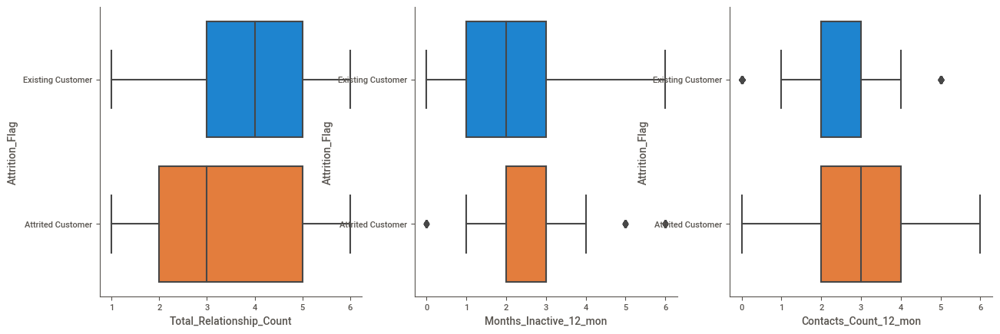

In [46]:
f,axes = plt.subplots(1, 3, figsize=(15,5))
sns.boxplot(x='Total_Relationship_Count',y='Attrition_Flag',data=final_df, ax=axes[0])
sns.boxplot(x='Months_Inactive_12_mon',y='Attrition_Flag',data=final_df, ax=axes[1])
sns.boxplot(x='Contacts_Count_12_mon',y='Attrition_Flag',data=final_df, ax=axes[2])
sns.despine(left=False, bottom=False)

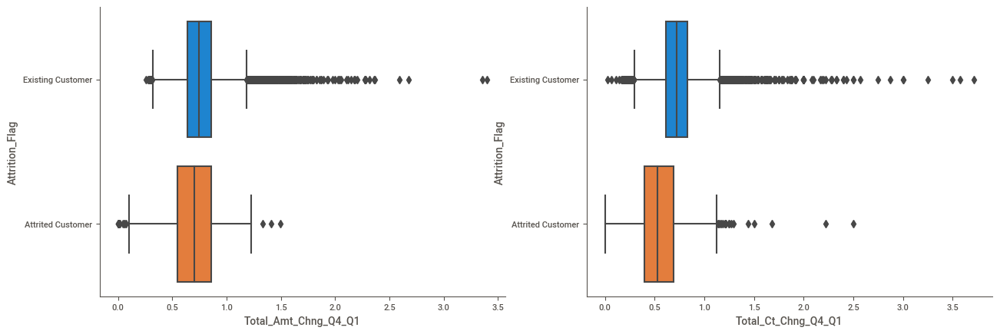

In [47]:
f,axes = plt.subplots(1, 2, figsize=(15,5))
sns.boxplot(x='Total_Amt_Chng_Q4_Q1',y='Attrition_Flag',data=final_df, ax=axes[0])
sns.boxplot(x='Total_Ct_Chng_Q4_Q1',y='Attrition_Flag',data=final_df, ax=axes[1])
sns.despine(left=False, bottom=False)

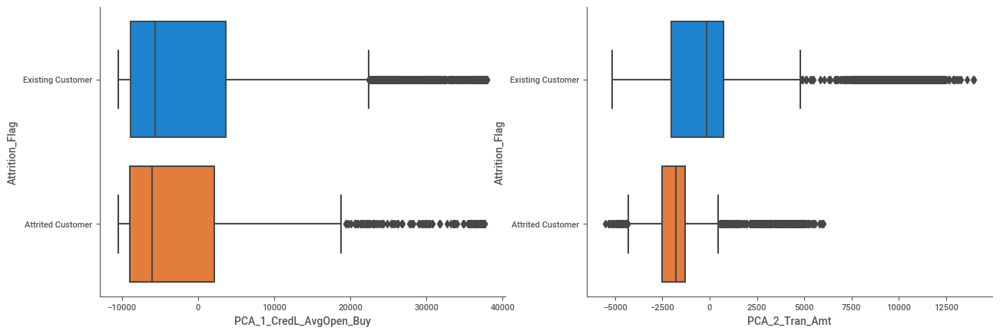

In [48]:
f,axes = plt.subplots(1, 2, figsize=(15,5))
sns.boxplot(x='PCA_1_CredL_AvgOpen_Buy',y='Attrition_Flag',data=final_df, ax=axes[0])
sns.boxplot(x='PCA_2_Tran_Amt',y='Attrition_Flag',data=final_df, ax=axes[1])
sns.despine(left=False, bottom=False)

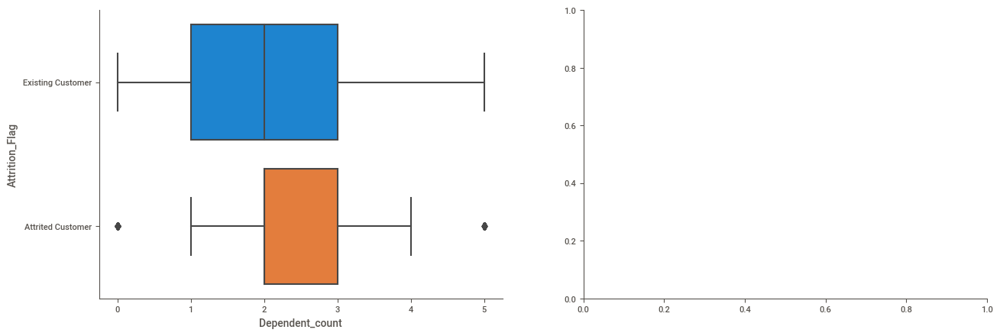

In [49]:
f,axes = plt.subplots(1, 2, figsize=(15,5))
sns.boxplot(x='Dependent_count',y='Attrition_Flag',data=final_df, ax=axes[0])
#sns.boxplot(x='Dependent_count',y='Attrition_Flag',data=final_df, ax=axes[0])
sns.despine(left=False, bottom=False)

### Data Mapping

In [50]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Total_Relationship_Count  10127 non-null  int64  
 9   Months_Inactive_12_mon    10127 non-null  int64  
 10  Contacts_Count_12_mon     10127 non-null  int64  
 11  Total_Amt_Chng_Q4_Q1      10127 non-null  float64
 12  Total_Ct_Chng_Q4_Q1       10127 non-null  float64
 13  PCA_1_CredL_AvgOpen_Buy   10127 non-null  float64
 14  PCA_2_

In [51]:
data = final_df.copy()
print("Unique values in each non-numeric column:\t")
for col in data.select_dtypes(include=[object]):
    print(col,"\n:", data[col].unique())

Unique values in each non-numeric column:	
Attrition_Flag 
: ['Existing Customer' 'Attrited Customer']
Gender 
: ['M' 'F']
Education_Level 
: ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status 
: ['Married' 'Single' 'Unknown' 'Divorced']
Income_Category 
: ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Card_Category 
: ['Blue' 'Gold' 'Silver' 'Platinum']


In [52]:
data['Attrition_Flag'] = data['Attrition_Flag'].map({'Attrited Customer':1, 'Existing Customer':0})
data['Gender'] = data['Gender'].map({'M':0, 'F':1})
data['Education_Level'] = data['Education_Level'].map({'High School':1, 'College':2, 'Graduate':3, 'Post-Graduate':4, 'Doctorate':5, 'Uneducated':6, 'Unknown':7})
data['Marital_Status'] = data['Marital_Status'].map({'Married':1, 'Single':2, 'Divorced':3, 'Unknown':4})
data['Income_Category'] = data['Income_Category'].map({'Less than $40K':1, '$40K - $60K':2, '$60K - $80K':3, '$80K - $120K':4, '$120K +':5, 'Unknown':6})
data['Card_Category'] = data['Card_Category'].map({'Blue':1, 'Silver':2, 'Gold':3, 'Platinum':4})

In [53]:
data.head()

,CLIENTNUM,Attrition_Flag,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1,PCA_1_CredL_AvgOpen_Buy,PCA_2_Tran_Amt
0,768805383,0,0,3,1,1,3,1,5,1,3,1.33,1.62,5850.15,-3553.81
1,818770008,0,1,5,3,2,1,1,6,1,2,1.54,3.71,-469.11,-3101.46
2,713982108,0,0,3,3,1,4,1,4,1,0,2.59,2.33,-6664.30,-2230.73
3,769911858,0,1,4,1,4,1,1,3,4,1,1.41,2.33,-8625.04,-2787.04
4,709106358,0,0,3,6,1,3,1,5,1,0,2.17,2.50,-4882.07,-3388.10


In [54]:
data.drop(['CLIENTNUM'],axis=1).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Gender                    10127 non-null  int64  
 2   Dependent_count           10127 non-null  int64  
 3   Education_Level           10127 non-null  int64  
 4   Marital_Status            10127 non-null  int64  
 5   Income_Category           10127 non-null  int64  
 6   Card_Category             10127 non-null  int64  
 7   Total_Relationship_Count  10127 non-null  int64  
 8   Months_Inactive_12_mon    10127 non-null  int64  
 9   Contacts_Count_12_mon     10127 non-null  int64  
 10  Total_Amt_Chng_Q4_Q1      10127 non-null  float64
 11  Total_Ct_Chng_Q4_Q1       10127 non-null  float64
 12  PCA_1_CredL_AvgOpen_Buy   10127 non-null  float64
 13  PCA_2_Tran_Amt            10127 non-null  float64
dtypes: flo

In [55]:
data.head()

,CLIENTNUM,Attrition_Flag,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1,PCA_1_CredL_AvgOpen_Buy,PCA_2_Tran_Amt
0,768805383,0,0,3,1,1,3,1,5,1,3,1.33,1.62,5850.15,-3553.81
1,818770008,0,1,5,3,2,1,1,6,1,2,1.54,3.71,-469.11,-3101.46
2,713982108,0,0,3,3,1,4,1,4,1,0,2.59,2.33,-6664.30,-2230.73
3,769911858,0,1,4,1,4,1,1,3,4,1,1.41,2.33,-8625.04,-2787.04
4,709106358,0,0,3,6,1,3,1,5,1,0,2.17,2.50,-4882.07,-3388.10


### OHE & Train/Test Split

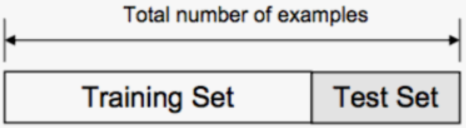

In [56]:
from IPython.display import Image
Image("traintest.png")

In [57]:
model_df = data.copy()

In [58]:
model_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  int64  
 5   Marital_Status            10127 non-null  int64  
 6   Income_Category           10127 non-null  int64  
 7   Card_Category             10127 non-null  int64  
 8   Total_Relationship_Count  10127 non-null  int64  
 9   Months_Inactive_12_mon    10127 non-null  int64  
 10  Contacts_Count_12_mon     10127 non-null  int64  
 11  Total_Amt_Chng_Q4_Q1      10127 non-null  float64
 12  Total_Ct_Chng_Q4_Q1       10127 non-null  float64
 13  PCA_1_CredL_AvgOpen_Buy   10127 non-null  float64
 14  PCA_2_

Since we have mapped all the features to categorical value, we can bypass OHE process in this case.

In [59]:
X = model_df.drop(['CLIENTNUM','Attrition_Flag'],axis=1)
y = model_df['Attrition_Flag']

In [60]:
# Apply train, test split
print(X.shape, y.shape)
print('So in X dataframe, there are {} independent variables and in Y dataframe, only 1 target variable.'.format(X.shape[1], 1))
print('Also there are {} number of observations.'.format(X.shape[0]))

(10127, 13) (10127,)
So in X dataframe, there are 13 independent variables and in Y dataframe, only 1 target variable.
Also there are 10127 number of observations.


In [61]:
X_train, X_validation, y_train, y_validation = train_test_split(X, y, test_size = 0.50, random_state = 24)
print('Training examples: {}'.format(X_train.shape[0]))
print('So in X_train dataframe, there are {} independent variables and only 1 target variable.'.format(X_train.shape[1],+1))
print('Also there are {} number of observations.'.format(X_train.shape[0]))
print('==' * 50)
print('Validation examples:  {}'.format(X_validation.shape[0]))
print('So in X_validation dataframe, there are {} independent variables and only 1 target variable.'.format(X_validation.shape[1],+1))
print('Also there are {} number of observations.'.format(X_validation.shape[0]))

Training examples: 5063
So in X_train dataframe, there are 13 independent variables and only 1 target variable.
Also there are 5063 number of observations.
Validation examples:  5064
So in X_validation dataframe, there are 13 independent variables and only 1 target variable.
Also there are 5064 number of observations.


### Dealing with unbalanced dataset

Imbalanced data is a very common occurrence in real-world domains, especially when the subject of interest for a decision-making system is a rare but important case. This can be a problem when a future decision is to be made based on insights from historical data. Inadequate data from the minority case can hamper the robustness of the new decision being made.

Dealing with imbalanced data:
We will explore one example for each of these 3 methods:
- Random undersampling with RandomUnderSampler
- Oversampling with SMOTE (Synthetic Minority Over-sampling Technique)
- A combination of both random undersampling and oversampling using pipeline

<b>Oversampling with SMOTE (Synthetic Minority Over-sampling Technique)</b>

To illustrate how this technique works consider some training data which has s samples, and f features in the feature space of the data. 

As an example, consider a dataset of birds for classification. 

- The feature space for the minority class for which we want to oversample could be beak length, wingspan, and weight. 
- To then oversample, take a sample from the dataset, and consider its k nearest neighbors (in feature space). 
- To create a synthetic data point, take the vector between one of those k neighbors, and the current data point. 
- Multiply this vector by a random number x which lies between 0, and 1. 
- Add this to the current data point to create the new, synthetic data point.

In [62]:
print("Before oversampling: ",Counter(y_train))

Before oversampling:  Counter({0: 4240, 1: 823})


In [63]:
X_train

,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1,PCA_1_CredL_AvgOpen_Buy,PCA_2_Tran_Amt
6767,1,0,7,2,1,1,6,3,3,0.77,0.46,-8821.48,69.16
7502,1,4,7,2,2,1,6,2,3,0.81,0.67,-1862.37,481.85
2467,1,3,3,1,1,1,6,2,3,0.61,0.64,-8848.03,-2393.90
5273,0,1,6,2,3,1,6,3,1,0.93,0.74,-8519.35,553.71
4503,1,4,3,1,6,1,5,1,1,0.82,0.74,-1049.52,-5.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6500,0,4,6,1,1,1,4,3,2,0.61,0.50,-9239.17,386.52
5249,0,2,3,1,4,1,5,6,3,0.79,0.89,30624.94,-1434.92
3473,1,2,1,2,1,1,5,2,3,0.72,0.72,-2200.80,-1093.07
8535,1,0,6,1,2,1,1,3,3,0.81,1.19,-9118.06,1379.88


In [64]:
from imblearn.over_sampling import SMOTE
# define oversampling strategy
SMOTE = SMOTE()
# fit and apply the transform
X_train_SMOTE, y_train_SMOTE = SMOTE.fit_resample(X_train, y_train)
X_validation_SMOTE, y_validation_SMOTE = SMOTE.fit_resample(X_validation, y_validation)
# summarize class distribution
print("After oversampling: ",Counter(y_train_SMOTE))
print("After oversampling: ",Counter(y_validation_SMOTE))

After oversampling:  Counter({0: 4240, 1: 4240})
After oversampling:  Counter({0: 4260, 1: 4260})


In [65]:
print('Training examples: {}'.format(X_train_SMOTE.shape[0]))
print('So in X_train dataframe, there are {} independent variables and only 1 target variable.'.format(X_train_SMOTE.shape[1],+1))
print('Also there are {} number of observations.'.format(X_train_SMOTE.shape[0]))
print('==' * 50)
print('Validation examples:  {}'.format(X_validation_SMOTE.shape[0]))
print('So in X_validation dataframe, there are {} independent variables and only 1 target variable.'.format(X_validation_SMOTE.shape[1],+1))
print('Also there are {} number of observations.'.format(X_validation_SMOTE.shape[0]))

Training examples: 8480
So in X_train dataframe, there are 13 independent variables and only 1 target variable.
Also there are 8480 number of observations.
Validation examples:  8520
So in X_validation dataframe, there are 13 independent variables and only 1 target variable.
Also there are 8520 number of observations.


In [66]:
def score(confusion_matrix):
    TN = confusion_matrix[0,0]
    FN = confusion_matrix[0,1]
    FP = confusion_matrix[1,0]
    TP = confusion_matrix[1,1]
    accuracy_score = (TP+TN)/(TN+TP+FP+FN)
    recall_score = TP/(TP+FN)
    precision = TP/(TP+FP)
    F1=(2*precision*recall_score)/(precision+recall_score)
    return accuracy_score,recall_score,precision,F1

## Model Development

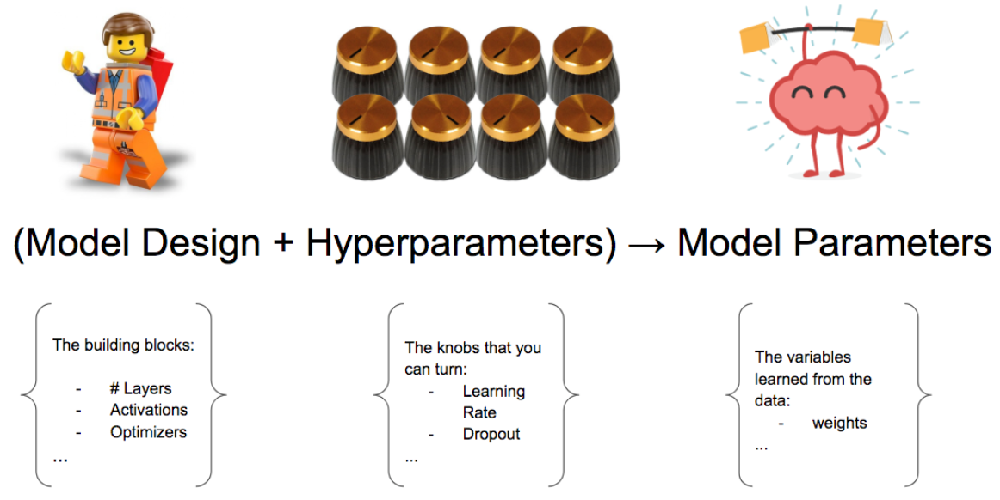

In [67]:
from IPython.display import Image
Image("hyperparam.png")

Hyperparameter tuning makes the process of determining the best hyperparameter settings easier and less tedious. Hyperparameter tuning works by running multiple trials in a single training job. Each trial is a complete execution of your training application with values for your chosen hyperparameters, set within limits you specify.

### Logistic Regression

Logisic regression is typically used for classification problem. Mathematically, it can be expressed as
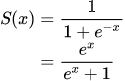
It calculates the probability that an event is likely to occur and expressed that probability value between 0 and 1.
Usually logistic regression is easier to digest as it adopts a similar approach of linear regression.

In [68]:
logit = LogisticRegression(random_state=24)

# Construct the hyperparameter grid
param_grid = {'penalty':['l1', 'l2'], 'C':np.logspace(0, 4, 10)}

# Instantiate the GridSearchCV object using the estimator object,
# the hyperparameter grid, & 10-fold cross-validation
grid_logit = GridSearchCV(logit, param_grid=param_grid, cv=10)
grid_logit.fit(X_train, y_train)
y_pred_logit = grid_logit.predict(X_validation)
cm_logit = confusion_matrix(y_validation, y_pred_logit, labels=None, sample_weight=None)
cm_logit_train = confusion_matrix(y_train, grid_logit.predict(X_train), labels=None, sample_weight=None)

print('\Train Dataset | Classification Report:\n')
print('Confusion_matrix  : \n{}\n'.format(cm_logit_train))
print('Accuracy Score    : {:5.3f}'.format(score(cm_logit_train)[0]))
print('\nClassification Report:\n')
print(classification_report(y_train, grid_logit.predict(X_train)))

print('\nTest Dataset | Classification Report:\n')
print('Confusion_matrix  : \n{}\n'.format(cm_logit))
print('Accuracy Score    : {:5.3f}'.format(score(cm_logit)[0]))
print('\nClassification Report:\n')
print(classification_report(y_validation, y_pred_logit))

print('Optimal hyperparameter(s): {}.'.format(dict(grid_logit.best_params_)))
print('Optimal Estimator:\n{}'.format(grid_logit.best_estimator_))

\Train Dataset | Classification Report:

Confusion_matrix  : 
[[4172   68]
 [ 626  197]]

Accuracy Score    : 0.863

Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.98      0.92      4240
           1       0.74      0.24      0.36       823

    accuracy                           0.86      5063
   macro avg       0.81      0.61      0.64      5063
weighted avg       0.85      0.86      0.83      5063


Test Dataset | Classification Report:

Confusion_matrix  : 
[[4185   75]
 [ 630  174]]

Accuracy Score    : 0.861

Classification Report:

              precision    recall  f1-score   support

           0       0.87      0.98      0.92      4260
           1       0.70      0.22      0.33       804

    accuracy                           0.86      5064
   macro avg       0.78      0.60      0.63      5064
weighted avg       0.84      0.86      0.83      5064

Optimal hyperparameter(s): {'C': 1.0, 'penalty': 'l2'}.
Optimal E

### Bagging Model | Random Forest

Random forests are made up from multiple decision trees to reach to a single forest. By virtue, it is much stronger than decision tree and can overcome typical problems like over-pruning / bias.

<b>How is that possible?</b><br/>
Random forests are an ensemble learning method using bagging/bootstrap algorithm. Basically, it draws random bagging samples from the training dataset and also random subsets of features for traning the individual trees.

And due to the random features selection, the trees are more independent of each other compared to regular bagging, which often results in better predictive performance (due to better variance-bias trade-offs).

In [70]:
rf_clf = RandomForestClassifier(max_features=7,random_state=24)
# Construct the hyperparameter grid
param_grid = {'n_estimators': [1000, 2000, 3000],
              'max_features': ['auto'],
              'max_depth' : [3,4,5],
              'criterion' : ['entropy'], 
              'oob_score' :[True, False]
             }
# Instantiate the GridSearchCV object using the estimator object,
# the hyperparameter grid, & 10-fold cross-validation
grid_rf = GridSearchCV(rf_clf, param_grid=param_grid, cv=10)
grid_rf.fit(X_train, y_train)
y_pred_rf = grid_rf.predict(X_validation)
cm_rf_train = confusion_matrix(y_train, grid_rf.predict(X_train), labels=None, sample_weight=None)
cm_rf = confusion_matrix(y_validation, y_pred_rf, labels=None, sample_weight=None)

print('\nTrain Dataset | Classification Report:\n')
print('Confusion_matrix  : \n{}\n'.format(cm_rf_train))
print('Accuracy Score    : {:5.3f}'.format(score(cm_rf_train)[0]))
print(classification_report(y_train, grid_rf.predict(X_train)))

print('\nTest Dataset | Classification Report:\n')
print('Confusion_matrix  : \n{}\n'.format(cm_rf))
print('Accuracy Score    : {:5.3f}'.format(score(cm_rf)[0]))
print(classification_report(y_validation, y_pred_rf))

print('Optimal hyperparameter(s): {}.'.format(dict(grid_rf.best_params_)))
print('Optimal Estimator:\n{}'.format(grid_rf.best_estimator_))


Train Dataset | Classification Report:

Confusion_matrix  : 
[[4231    9]
 [ 538  285]]

F-Score    : 0.892
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      4240
           1       0.97      0.35      0.51       823

    accuracy                           0.89      5063
   macro avg       0.93      0.67      0.72      5063
weighted avg       0.90      0.89      0.87      5063


Test Dataset | Classification Report:

Confusion_matrix  : 
[[4239   21]
 [ 560  244]]

F-Score    : 0.885
              precision    recall  f1-score   support

           0       0.88      1.00      0.94      4260
           1       0.92      0.30      0.46       804

    accuracy                           0.89      5064
   macro avg       0.90      0.65      0.70      5064
weighted avg       0.89      0.89      0.86      5064

Optimal hyperparameter(s): {'criterion': 'entropy', 'max_depth': 5, 'max_features': 'auto', 'n_estimators': 1000, 'oob_score': Tr

### Boosting Model | XGBoost

XGBoost is an algorithm that has recently been dominating applied machine learning and Kaggle competitions for structured or tabular data. 

XGBoost is an implementation of gradient boosted decision trees designed for speed and performance. XGBoost stands for eXtreme Gradient Boosting. 

Both GBM & XGBoost are the same, XGBoost and GBM, both works on the same principle. In XGBoost parallel computation is possible, means in XGBoost parallelly many GBM's are working. In XGBoost tunning parameters are more. Any of them can be used, XGBoost can easily tweak by tuning the hyperparameters, giving slightly more accurate score.

GBM has three main components.<br/>
<b>Loss Function:</b> The role of the loss function is to estimate how best is the model in making predictions with the given data.<br/>
<b>Weak Learner:</b> The model fits a sequence of weak learners − models that are only slightly better than random guessings, such as small decision trees − to weighted versions of the data. More weight is given to examples that were misclassified by earlier rounds.<br/>
<b>Additive Model:</b> It is an iterative and sequential process in adding the decision trees one step at a time. Each iteration should reduce the value of loss function. A fixed number of trees are added, or training stops once loss reaches an acceptable level or no longer improves on an external validation dataset.

In [71]:
xgb = XGBClassifier(n_estimators=100,learning_rate=0.02,random_state=24)
# Construct the hyperparameter grid
param_grid = {'n_estimators': [500, 1000, 2000],
               'max_depth' : [4,5,6], 
               'learning_rate' : [0.01,0.02,0.05,0.10],
             }

# Instantiate the GridSearchCV object using the estimator object,
# the hyperparameter grid, & 10-fold cross-validation
grid_xgb = GridSearchCV(xgb, param_grid=param_grid, cv=10)
grid_xgb.fit(X_train, y_train, eval_metric='logloss')
y_pred_xgb = grid_xgb.predict(X_validation)
cm_xgb = confusion_matrix(y_validation, y_pred_xgb, labels=None, sample_weight=None)
cm_xgb_train = confusion_matrix(y_train, grid_xgb.predict(X_train), labels=None, sample_weight=None)

print('\nTrain Dataset | Classification Report:\n')
print('Confusion_matrix  : \n{}\n'.format(cm_xgb_train))
print('Accuracy Score    : {:5.3f}'.format(score(cm_xgb_train)[0]))
print(classification_report(y_train, grid_rf.predict(X_train)))

print('\nTest Dataset | Classification Report:\n')
print('Confusion_matrix  : \n{}\n'.format(cm_xgb))
print('Accuracy Score    : {:5.3f}'.format(score(cm_xgb)[0]))
print(classification_report(y_validation, y_pred_xgb))

print('Optimal hyperparameter(s): {}.'.format(dict(grid_xgb.best_params_)))
print('Optimal Estimator:\n{}'.format(grid_xgb.best_estimator_))


Train Dataset | Classification Report:

Confusion_matrix  : 
[[4234    6]
 [  12  811]]

Accuracy Score    : 0.996
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      4240
           1       0.97      0.35      0.51       823

    accuracy                           0.89      5063
   macro avg       0.93      0.67      0.72      5063
weighted avg       0.90      0.89      0.87      5063


Test Dataset | Classification Report:

Confusion_matrix  : 
[[4149  111]
 [ 242  562]]

Accuracy Score    : 0.930
              precision    recall  f1-score   support

           0       0.94      0.97      0.96      4260
           1       0.84      0.70      0.76       804

    accuracy                           0.93      5064
   macro avg       0.89      0.84      0.86      5064
weighted avg       0.93      0.93      0.93      5064

Optimal hyperparameter(s): {'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 500}.
Optimal Estimator:
XGBClas

## Model Comparison

### Receiver Operating Characteristics (ROC)

In [110]:
logit_model = LogisticRegression(penalty='l2',C = 1.0, random_state=24)
logit_model.fit(X_train, y_train)
        
rf_model = RandomForestClassifier(criterion='entropy', max_depth=5, n_estimators=1000,
                       oob_score=True, random_state=24)
rf_model.fit(X_train, y_train)

xgb_model = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, monotone_constraints='()',
              n_estimators=500, n_jobs=8, num_parallel_tree=1, random_state=24,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
xgb_model.fit(X_train, y_train, eval_metric='logloss')

print(logit_model)
print(rf_model)
print(xgb_model)

LogisticRegression(random_state=24)
RandomForestClassifier(criterion='entropy', max_depth=5, n_estimators=1000,
                       oob_score=True, random_state=24)
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=500, n_jobs=8, num_parallel_tree=1, random_state=24,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


Receiver Operating Characteristics:



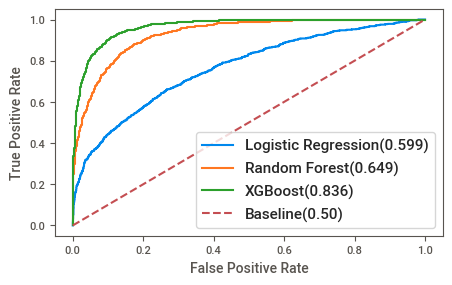

In [115]:
print('Receiver Operating Characteristics:\n')

logit_roc_auc = roc_auc_score(y_validation, logit_model.predict(X_validation))
rf_roc_auc = roc_auc_score(y_validation, rf_model.predict(X_validation))
xgb_roc_auc = roc_auc_score(y_validation, xgb_model.predict(X_validation))

fpr1, tpr1, thresholds1 = roc_curve(y_validation, grid_logit.predict_proba(X_validation)[:,1])
fpr2, tpr2, thresholds2 = roc_curve(y_validation, grid_ran.predict_proba(X_validation)[:,1])
fpr3, tpr3, thresholds3 = roc_curve(y_validation, grid_xgb.predict_proba(X_validation)[:,1])

plt.figure(figsize=(5,3))
plt.plot(fpr1, tpr1, label='Logistic Regression(%0.3f)' % logit_roc_auc)
plt.plot(fpr2, tpr2, label='Random Forest(%0.3f)' % rf_roc_auc)
plt.plot(fpr3, tpr3, label='XGBoost(%0.3f)' % xgb_roc_auc)
plt.plot([0, 1], [0, 1],'r--',label='Baseline(0.50)')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
#plt.suptitle('Receiver Operating Characteristics [ROC]')
#plt.title('AUC Scoreboard')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

### Features Importance

In [116]:
dffeatures = pd.DataFrame(xgb_model.feature_importances_)
dfcolumns = pd.DataFrame(X_train.columns)
featureScores = pd.concat([dfcolumns, dffeatures], axis=1)
featureScores.columns = ['Features','Importance'] # naming the dataframe columns
print(featureScores.nlargest(10,'Importance')) # provide top features

                    Features  Importance
6   Total_Relationship_Count        0.20
0                     Gender        0.12
10       Total_Ct_Chng_Q4_Q1        0.12
12            PCA_2_Tran_Amt        0.11
8      Contacts_Count_12_mon        0.09
7     Months_Inactive_12_mon        0.09
9       Total_Amt_Chng_Q4_Q1        0.06
11   PCA_1_CredL_AvgOpen_Buy        0.06
1            Dependent_count        0.04
3             Marital_Status        0.04


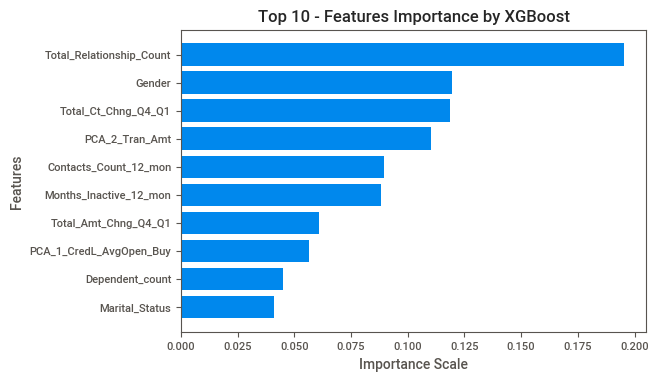

In [119]:
plot_DT = featureScores.nlargest(10,'Importance').reset_index().drop('index',axis=1).sort_values('Importance', ascending=True)
plt.barh(plot_DT['Features'],plot_DT['Importance'])
plt.title("Top 10 - Features Importance by XGBoost")
plt.ylabel("Features")
plt.xlabel("Importance Scale")
plt.show()

## SHapley Additive exPlanations (SHAP)

In [121]:
import shap
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_validation)
print('Expected Value:', explainer.expected_value)
pd.DataFrame(shap_values).head()

Expected Value: -2.046346


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.07,0.19,0.03,0.03,0.02,-0.04,0.08,0.00,0.19,-0.62,-0.59,-0.54,-3.35
1,-0.12,0.07,-0.04,0.09,-0.05,0.08,-0.49,0.29,0.16,-0.48,-1.07,-1.88,-0.31
2,-0.18,0.04,0.04,0.25,-0.21,-0.00,-0.47,-1.56,-2.00,-0.20,1.00,-0.27,-0.70
3,0.09,-0.19,-0.21,0.09,-0.04,0.11,-0.08,1.77,0.33,-0.40,-0.86,0.44,0.39
4,-0.21,0.07,-0.18,-0.02,0.13,-0.03,-0.86,0.25,0.13,0.26,-0.86,-0.56,-0.04


In [122]:
shap.initjs()
shap.force_plot(explainer.expected_value,shap_values[0,:], X_validation.iloc[0,:])

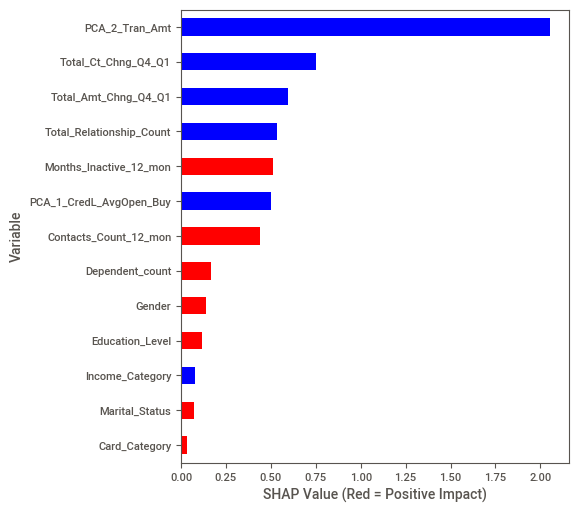

In [127]:
def ABS_SHAP(df_shap, df):
    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop('index',axis=1)
    
    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i],df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)

    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns = ['Variable','Corr']
    corr_df['Sign'] = np.where(corr_df['Corr']>0,'red','blue')
    
    # Plot it
    shap_abs = np.abs(shap_v)
    k=pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ['Variable','SHAP_abs']
    k2 = k.merge(corr_df,left_on = 'Variable',right_on='Variable',how='inner')
    k2 = k2.sort_values(by='SHAP_abs',ascending = True)
    colorlist = k2['Sign']
    ax = k2.plot.barh(x='Variable',y='SHAP_abs',color = colorlist, figsize=(5,6),legend=False)
    ax.set_xlabel("SHAP Value (Red = Positive Impact)")

ABS_SHAP(shap_values,X_validation)

## Conclusion

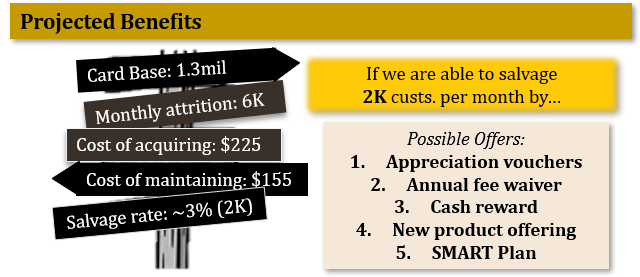

In [129]:
from IPython.display import Image
Image("conclusion.png")

Note: The above is purely based on assumptions. If we could get a copy of the profit model and knowing the exact salvage rate, we might be able to compute the economic profits.